In [ ]:
import tensorflow as tf
from tensorflow import keras
import tensorflow_datasets as tfds


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import datetime

In [2]:
import random as rn
import os
from numpy.random import seed

# Supressing redundant warnings from experimental layers
# and keeping only actual error reports
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

# Making examples reproducible
# Sets seeds for Keras, TensorFlow and Numpy
#tf.keras.utils.set_random_seed(42)
#tf.config.experimental.enable_op_determinism()

In [3]:
(train_set, test_set, valid_set), info = tfds.load("imagenet_resized/64x64", 
                                           split=["train[:80%]", "validation", "train[80%:]"],
                                           as_supervised=True, with_info=True)

class_names = info.features["label"].names
n_classes = info.features["label"].num_classes
print(f'Class names: {class_names}', ) # ['n01440764', 'n02102040', 'n02979186', 'n03000684', 'n03028079', 'n03394916', 'n03417042', 'n03425413', 'n03445777', 'n03888257']
print('Num of classes:', n_classes) # Num of classes: 10

print("Train set size:", len(train_set)) # Train set size: 7102
print("Test set size:", len(test_set)) # Test set size: 947
print("Valid set size:", len(valid_set)) # Valid set size: 1420

Class names: ['n02119789', 'n02100735', 'n02110185', 'n02096294', 'n02102040', 'n02066245', 'n02509815', 'n02124075', 'n02417914', 'n02123394', 'n02125311', 'n02423022', 'n02346627', 'n02077923', 'n02110063', 'n02447366', 'n02109047', 'n02089867', 'n02102177', 'n02091134', 'n02092002', 'n02071294', 'n02442845', 'n02504458', 'n02092339', 'n02098105', 'n02096437', 'n02114712', 'n02105641', 'n02128925', 'n02091635', 'n02088466', 'n02096051', 'n02117135', 'n02138441', 'n02097130', 'n02493509', 'n02457408', 'n02389026', 'n02443484', 'n02110341', 'n02089078', 'n02086910', 'n02445715', 'n02093256', 'n02113978', 'n02106382', 'n02441942', 'n02113712', 'n02113186', 'n02105162', 'n02415577', 'n02356798', 'n02488702', 'n02123159', 'n02098413', 'n02422699', 'n02114855', 'n02094433', 'n02111277', 'n02132136', 'n02119022', 'n02091467', 'n02106550', 'n02422106', 'n02091831', 'n02120505', 'n02104365', 'n02086079', 'n02112706', 'n02098286', 'n02095889', 'n02484975', 'n02137549', 'n02500267', 'n02129604'

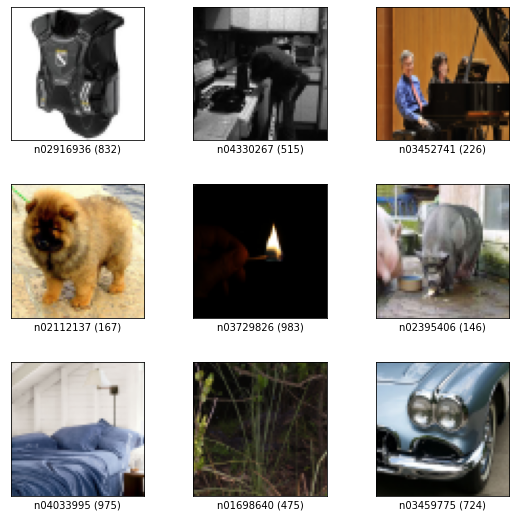

In [4]:
fig = tfds.visualization.show_examples(train_set, info)
plt.show()

In [5]:
(train_set, test_set, valid_set), info = tfds.load("imagenette", 
                                           split=["train[:70%]", "train[70%:]", "validation"],
                                           as_supervised=True, with_info=True)

class_names = info.features["label"].names
n_classes = info.features["label"].num_classes
print(f'Class names: {class_names}', ) # ['n01440764', 'n02102040', 'n02979186', 'n03000684', 'n03028079', 'n03394916', 'n03417042', 'n03425413', 'n03445777', 'n03888257']
print('Num of classes:', n_classes) # Num of classes: 10

print("Train set size:", len(train_set)) # Train set size: 7102
print("Test set size:", len(test_set)) # Test set size: 947
print("Valid set size:", len(valid_set)) # Valid set size: 1420

Class names: ['n01440764', 'n02102040', 'n02979186', 'n03000684', 'n03028079', 'n03394916', 'n03417042', 'n03425413', 'n03445777', 'n03888257']
Num of classes: 10
Train set size: 6628
Test set size: 2841
Valid set size: 3925


In [6]:
def preprocess_image(image, label):
    #cropped_image = tf.image.central_crop(image, 0.7)
    resized_image = tf.image.resize(image, [224, 224])
    return resized_image, label

In [7]:
train_set = train_set.map(preprocess_image).batch(16).prefetch(tf.data.AUTOTUNE)
test_set = test_set.map(preprocess_image).batch(16).prefetch(tf.data.AUTOTUNE)
valid_set = valid_set.map(preprocess_image).batch(16).prefetch(tf.data.AUTOTUNE)

In [8]:
labels = {
    'n01440764' : 'tench',
    'n02102040' : 'English springer',
    'n02979186' : 'cassette player',
    'n03000684' : 'chain saw', 
    'n03028079' : 'church', 
    'n03394916' : 'French horn', 
    'n03417042' : 'garbage truck', 
    'n03425413' : 'gas pump', 
    'n03445777' : 'golf ball', 
    'n03888257' : 'parachute'
}

def label_to_classname(label):
    return labels[label]

In [9]:
label_to_classname('n03425413')

'gas pump'

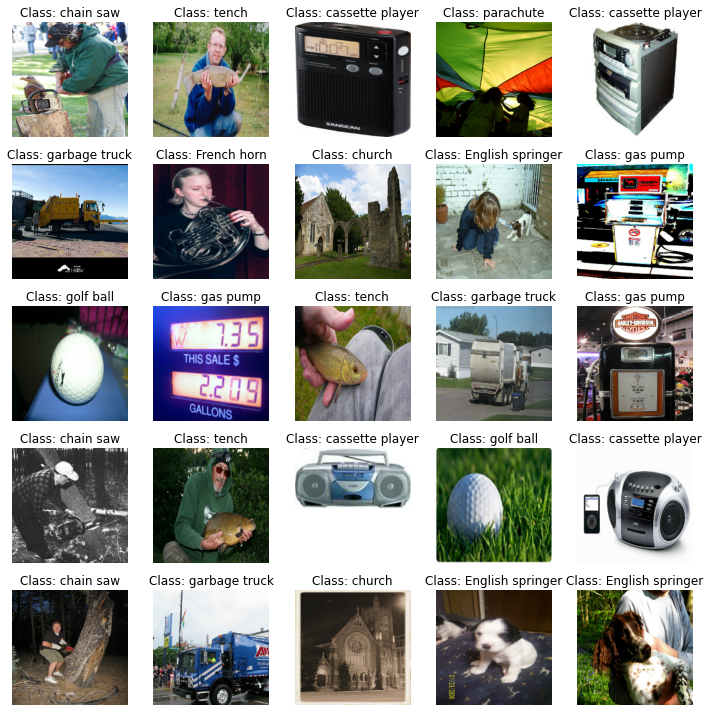

In [10]:
fig = plt.figure(figsize=(10, 10))

for index, entry in enumerate(test_set.take(25), start=1):

    sample_image = np.squeeze(entry[0].numpy()[0])
    sample_label = label_to_classname(class_names[entry[1].numpy()[0]])
    #sample_label = class_names[entry[1].numpy()[0]]
    
    ax = fig.add_subplot(5, 5, index)
    
    ax.imshow(np.array(sample_image, np.int32))
    ax.set_title(f"Class: {sample_label}")
    ax.axis('off')

plt.tight_layout()
plt.show()

In [11]:
lenet5 = keras.Sequential([
    keras.layers.InputLayer(input_shape=(None, None,3)),
    # Preprocessing made as part of the model itself
    # 'tanh' didn't do well with data augmentation
    # Resizing images down to 28, 28, since our input is 224, 224
    keras.layers.experimental.preprocessing.Resizing(28, 28),
    
    keras.layers.Conv2D(6, (5,5), padding='same', activation='tanh'),
    keras.layers.AveragePooling2D((2,2)),
    
    keras.layers.Conv2D(16, (5,5), padding='same', activation='tanh'),
    keras.layers.AveragePooling2D((2,2)),
    
    keras.layers.Conv2D(120, (5,5), padding='same', activation='tanh'),
    keras.layers.Flatten(),
    keras.layers.Dense(84, activation='tanh'),
    # LeCunn used Radial Basis Function, which isn't built into Keras
    # Modern networks use 'softmax', so we'll use that instead to 
    # avoid having to define a custom activation function for now
    keras.layers.Dense(n_classes, activation='softmax')    
])

lenet5.compile(loss='sparse_categorical_crossentropy', optimizer=keras.optimizers.SGD(), metrics=['accuracy'])

In [12]:
lenet5.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing (Resizing)         (None, 28, 28, 3)         0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 6)         456       
                                                                 
 average_pooling2d (AverageP  (None, 14, 14, 6)        0         
 ooling2D)                                                       
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 16)        2416      
                                                                 
 average_pooling2d_1 (Averag  (None, 7, 7, 16)         0         
 ePooling2D)                                                     
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 120)         4

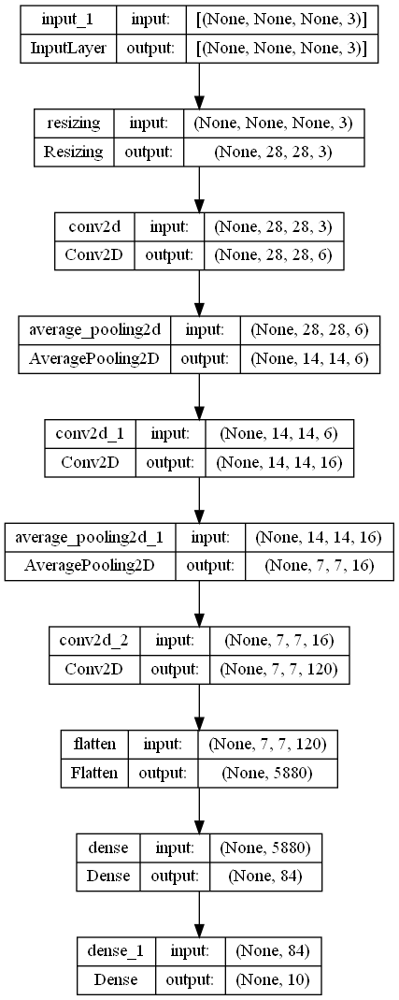

In [13]:
tf.keras.utils.plot_model(lenet5, to_file='lenet5.png', show_shapes=True)

In [14]:
reduceLr = keras.callbacks.ReduceLROnPlateau(patience=5, monitor='val_accuracy')
early_stopping = keras.callbacks.EarlyStopping(patience=10, monitor='val_accuracy', restore_best_weights=True)

lenet5_history = lenet5.fit(train_set, 
                            epochs=50,
                            validation_data=valid_set,
                            callbacks=[reduceLr, early_stopping])

Epoch 1/50
415/415 [==============================] - 7s 11ms/step - loss: 2.0956 - accuracy: 0.2584 - val_loss: 1.9919 - val_accuracy: 0.2910 - lr: 0.0100
Epoch 2/50
415/415 [==============================] - 5s 11ms/step - loss: 2.0226 - accuracy: 0.2998 - val_loss: 1.9605 - val_accuracy: 0.3282 - lr: 0.0100
Epoch 3/50
415/415 [==============================] - 5s 11ms/step - loss: 1.8698 - accuracy: 0.3644 - val_loss: 1.8388 - val_accuracy: 0.3684 - lr: 0.0100
Epoch 4/50
415/415 [==============================] - 5s 11ms/step - loss: 1.7783 - accuracy: 0.3967 - val_loss: 1.8325 - val_accuracy: 0.3625 - lr: 0.0100
Epoch 5/50
415/415 [==============================] - 5s 11ms/step - loss: 1.7200 - accuracy: 0.4110 - val_loss: 1.7500 - val_accuracy: 0.4094 - lr: 0.0100
Epoch 6/50
415/415 [==============================] - 5s 11ms/step - loss: 1.6510 - accuracy: 0.4386 - val_loss: 1.7227 - val_accuracy: 0.4110 - lr: 0.0100
Epoch 7/50
415/415 [==============================] - 5s 11ms/st

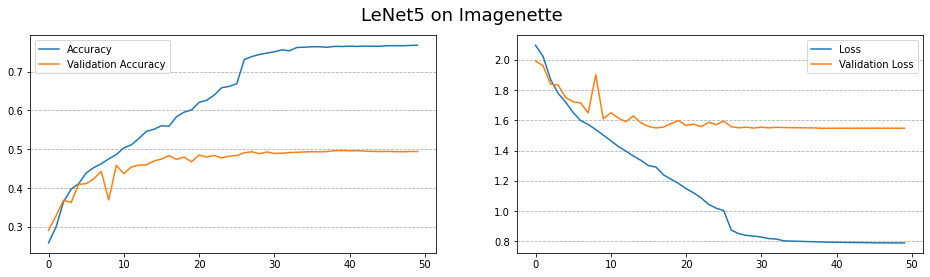

In [15]:
acc, val_acc = lenet5_history.history['accuracy'], lenet5_history.history['val_accuracy']
loss, val_loss = lenet5_history.history['loss'], lenet5_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('LeNet5 on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

In [16]:
lenet5_relu = keras.Sequential([
    keras.layers.InputLayer(input_shape=(None, None,3)),
    # ReLU performs better and allows for much better generalization!
    keras.layers.experimental.preprocessing.Resizing(28, 28),
    keras.layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    keras.layers.experimental.preprocessing.RandomRotation(0.2),
    
    keras.layers.Conv2D(6, (5,5), padding='same', activation='relu'),
    keras.layers.AveragePooling2D((2,2)),
    
    keras.layers.Conv2D(16, (5,5), padding='same', activation='relu'),
    keras.layers.AveragePooling2D((2,2)),
    
    keras.layers.Conv2D(120, (5,5), padding='same', activation='relu'),
    keras.layers.Flatten(),
    keras.layers.Dense(84, activation='relu'),
    # LeCunn used Radial Basis Function, which isn't built into Keras
    # Modern networks use 'softmax', so we'll use that instead to 
    # avoid having to define a custom activation function for now
    keras.layers.Dense(n_classes, activation='softmax')    
])

lenet5_relu.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [17]:
reduceLr = keras.callbacks.ReduceLROnPlateau(patience=5, monitor='val_accuracy')
early_stopping = keras.callbacks.EarlyStopping(patience=10, monitor='val_accuracy', restore_best_weights=True)

lenet5_relu_history = lenet5_relu.fit(train_set, 
                                      epochs=50, 
                                      batch_size=32, 
                                      validation_data=valid_set,
                                      callbacks=[reduceLr, early_stopping])

Epoch 1/50
415/415 [==============================] - 12s 27ms/step - loss: 2.8653 - accuracy: 0.2046 - val_loss: 2.0183 - val_accuracy: 0.2769 - lr: 0.0010
Epoch 2/50
415/415 [==============================] - 11s 27ms/step - loss: 2.0187 - accuracy: 0.2767 - val_loss: 1.9646 - val_accuracy: 0.3215 - lr: 0.0010
Epoch 3/50
415/415 [==============================] - 11s 27ms/step - loss: 1.9588 - accuracy: 0.3010 - val_loss: 1.9589 - val_accuracy: 0.3205 - lr: 0.0010
Epoch 4/50
415/415 [==============================] - 11s 27ms/step - loss: 1.9133 - accuracy: 0.3244 - val_loss: 1.8981 - val_accuracy: 0.3271 - lr: 0.0010
Epoch 5/50
415/415 [==============================] - 11s 27ms/step - loss: 1.8682 - accuracy: 0.3455 - val_loss: 1.8706 - val_accuracy: 0.3516 - lr: 0.0010
Epoch 6/50
415/415 [==============================] - 11s 27ms/step - loss: 1.8551 - accuracy: 0.3505 - val_loss: 1.8517 - val_accuracy: 0.3445 - lr: 0.0010
Epoch 7/50
415/415 [==============================] - 11s 

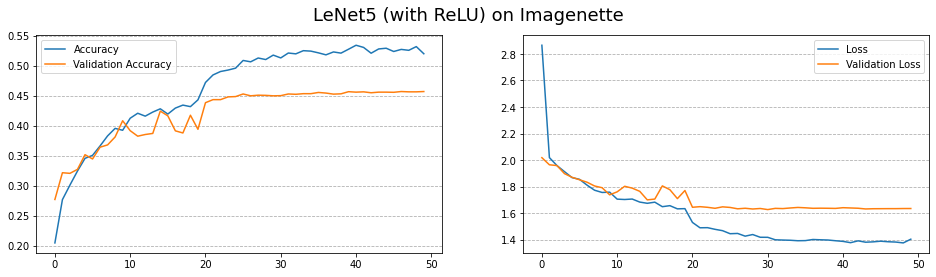

In [18]:
acc, val_acc = lenet5_relu_history.history['accuracy'], lenet5_relu_history.history['val_accuracy']
loss, val_loss = lenet5_relu_history.history['loss'], lenet5_relu_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('LeNet5 (with ReLU) on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

# AlexNet

In [19]:
alexnet = keras.Sequential([
    keras.layers.InputLayer(input_shape=(None, None, 3)),    
    keras.layers.experimental.preprocessing.Resizing(227, 227),    
    keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    keras.layers.experimental.preprocessing.RandomContrast(0.1),
    
    # No padding on the first Conv2D
    keras.layers.Conv2D(filters=96, kernel_size=(11, 11), strides=(4, 4), activation='relu'),
    keras.layers.MaxPooling2D((3, 3), strides=(2, 2)),
    keras.layers.BatchNormalization(),
    
    keras.layers.Conv2D(filters=256, kernel_size=(5, 5), strides=(1, 1), padding='same', activation='relu'),
    keras.layers.MaxPooling2D((3, 3), strides=(2, 2)),
    keras.layers.BatchNormalization(),
    
    keras.layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'),
    keras.layers.Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'),
    keras.layers.Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu'),
    keras.layers.MaxPooling2D((3, 3), strides=(2, 2)),
    
    keras.layers.Flatten(),
    
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.5),
    
    keras.layers.Dense(n_classes, activation='softmax')    
])

# AlexNet and VGG make adam get a stroke, SGD with manual hyperparameter tuning is required
# low learning rates because high learning rates updating so many parameters is a disaster
alexnet.compile(loss='sparse_categorical_crossentropy', 
                optimizer=keras.optimizers.SGD(nesterov=True, momentum=0.9, learning_rate=5e-5), 
                metrics=['accuracy'])

In [20]:
alexnet.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_2 (Resizing)       (None, 227, 227, 3)       0         
                                                                 
 random_flip_1 (RandomFlip)  (None, 227, 227, 3)       0         
                                                                 
 random_contrast (RandomCont  (None, 227, 227, 3)      0         
 rast)                                                           
                                                                 
 conv2d_6 (Conv2D)           (None, 55, 55, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 27, 27, 96)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 27, 27, 96)      

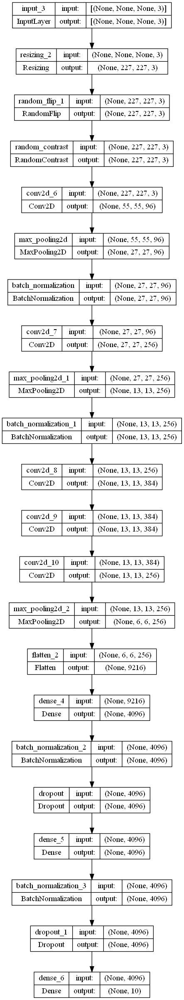

In [21]:
tf.keras.utils.plot_model(alexnet, to_file='alexnet.png', show_shapes=True)

In [22]:
reduceLr = keras.callbacks.ReduceLROnPlateau(patience=3, monitor='val_accuracy')
early_stopping = keras.callbacks.EarlyStopping(patience=10, monitor='val_accuracy', restore_best_weights=True)

alexnet_history = alexnet.fit(train_set, 
                              epochs=50, 
                              batch_size=32, 
                              validation_data=valid_set,
                              callbacks=[reduceLr, early_stopping])

Epoch 1/50
415/415 [==============================] - 53s 123ms/step - loss: 2.9662 - accuracy: 0.2213 - val_loss: 2.1237 - val_accuracy: 0.3549 - lr: 5.0000e-05
Epoch 2/50
415/415 [==============================] - 50s 121ms/step - loss: 2.4954 - accuracy: 0.3226 - val_loss: 1.6733 - val_accuracy: 0.4604 - lr: 5.0000e-05
Epoch 3/50
415/415 [==============================] - 51s 122ms/step - loss: 2.2571 - accuracy: 0.3799 - val_loss: 1.6125 - val_accuracy: 0.4854 - lr: 5.0000e-05
Epoch 4/50
415/415 [==============================] - 51s 122ms/step - loss: 2.0574 - accuracy: 0.4200 - val_loss: 1.6438 - val_accuracy: 0.5014 - lr: 5.0000e-05
Epoch 5/50
415/415 [==============================] - 50s 121ms/step - loss: 1.9237 - accuracy: 0.4526 - val_loss: 1.4007 - val_accuracy: 0.5625 - lr: 5.0000e-05
Epoch 6/50
415/415 [==============================] - 50s 121ms/step - loss: 1.8439 - accuracy: 0.4747 - val_loss: 1.5483 - val_accuracy: 0.5422 - lr: 5.0000e-05
Epoch 7/50
415/415 [========

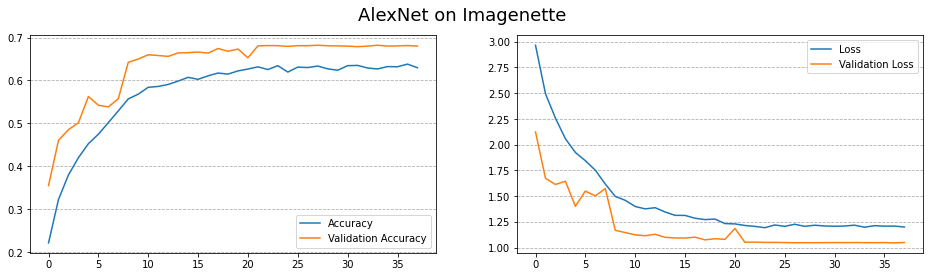

In [23]:
acc, val_acc = alexnet_history.history['accuracy'], alexnet_history.history['val_accuracy']
loss, val_loss = alexnet_history.history['loss'], alexnet_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('AlexNet on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

# VGGNet

In [24]:
vgg16 = keras.Sequential([
    keras.layers.InputLayer(input_shape=(None, None, 3)),    
    keras.layers.experimental.preprocessing.Resizing(224, 224),    
    keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    keras.layers.experimental.preprocessing.RandomRotation(0.1),
    keras.layers.experimental.preprocessing.RandomContrast(0.1),
    
    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(64, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same'),
    
    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(128, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding='same'),
    
    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    # Add next layer for VGG19
    #keras.layers.Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same'),
    
    keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    # Add next layer for VGG19
    #keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same'),
    
    keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    # Add next layer for VGG19
    #keras.layers.Conv2D(512, (3, 3), padding='same', activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same'),
    
    keras.layers.Flatten(),
    
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1024, activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)), 
    keras.layers.Dropout(0.5),
    keras.layers.Dense(1024, activation='relu', kernel_regularizer=keras.regularizers.L2(5e-4)),
    keras.layers.Dense(n_classes, activation='softmax')    
])

#vgg16 = keras.applications.VGG16(weights=None, classes=10)

vgg16.compile(loss='sparse_categorical_crossentropy', 
              optimizer=keras.optimizers.SGD(momentum=0.9, learning_rate=5e-4),
              metrics=['accuracy'])

In [25]:
vgg16.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resizing_3 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 random_flip_2 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 random_rotation_1 (RandomRo  (None, 224, 224, 3)      0         
 tation)                                                         
                                                                 
 random_contrast_1 (RandomCo  (None, 224, 224, 3)      0         
 ntrast)                                                         
                                                                 
 conv2d_11 (Conv2D)          (None, 224, 224, 64)      1792      
                                                                 
 conv2d_12 (Conv2D)          (None, 224, 224, 64)     

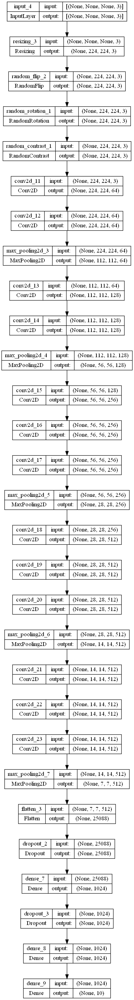

In [26]:
tf.keras.utils.plot_model(vgg16, to_file='vgg16.png', show_shapes=True)

In [27]:
# new_lr = lr*factor
reduceLr = keras.callbacks.ReduceLROnPlateau(patience=10, monitor='val_accuracy', factor=0.2)
early_stopping = keras.callbacks.EarlyStopping(patience=15, monitor='val_accuracy', restore_best_weights=True)

vgg_history = vgg16.fit(train_set, 
                        epochs=100,
                        validation_data=valid_set, 
                        callbacks=[reduceLr, early_stopping])

Epoch 1/100
415/415 [==============================] - 169s 396ms/step - loss: 5.6991 - accuracy: 0.1365 - val_loss: 5.5589 - val_accuracy: 0.2229 - lr: 5.0000e-04
Epoch 2/100
415/415 [==============================] - 161s 388ms/step - loss: 5.5314 - accuracy: 0.2195 - val_loss: 5.4006 - val_accuracy: 0.2754 - lr: 5.0000e-04
Epoch 3/100
415/415 [==============================] - 161s 388ms/step - loss: 5.3880 - accuracy: 0.2894 - val_loss: 5.3115 - val_accuracy: 0.3195 - lr: 5.0000e-04
Epoch 4/100
415/415 [==============================] - 161s 388ms/step - loss: 5.2585 - accuracy: 0.3368 - val_loss: 5.1122 - val_accuracy: 0.3809 - lr: 5.0000e-04
Epoch 5/100
415/415 [==============================] - 161s 387ms/step - loss: 5.1413 - accuracy: 0.3764 - val_loss: 5.0600 - val_accuracy: 0.3975 - lr: 5.0000e-04
Epoch 6/100
415/415 [==============================] - 161s 388ms/step - loss: 5.0505 - accuracy: 0.4110 - val_loss: 5.0719 - val_accuracy: 0.3761 - lr: 5.0000e-04
Epoch 7/100
415/

Epoch 51/100
415/415 [==============================] - 161s 388ms/step - loss: 3.3370 - accuracy: 0.8399 - val_loss: 3.7095 - val_accuracy: 0.7562 - lr: 5.0000e-04
Epoch 52/100
415/415 [==============================] - 161s 388ms/step - loss: 3.3124 - accuracy: 0.8414 - val_loss: 3.6490 - val_accuracy: 0.7743 - lr: 5.0000e-04
Epoch 53/100
415/415 [==============================] - 161s 388ms/step - loss: 3.2906 - accuracy: 0.8432 - val_loss: 3.6082 - val_accuracy: 0.7794 - lr: 5.0000e-04
Epoch 54/100
415/415 [==============================] - 161s 388ms/step - loss: 3.2743 - accuracy: 0.8517 - val_loss: 3.5651 - val_accuracy: 0.7862 - lr: 5.0000e-04
Epoch 55/100
415/415 [==============================] - 161s 388ms/step - loss: 3.2617 - accuracy: 0.8502 - val_loss: 3.6405 - val_accuracy: 0.7694 - lr: 5.0000e-04
Epoch 56/100
415/415 [==============================] - 161s 388ms/step - loss: 3.2232 - accuracy: 0.8626 - val_loss: 3.7465 - val_accuracy: 0.7414 - lr: 5.0000e-04
Epoch 57/1

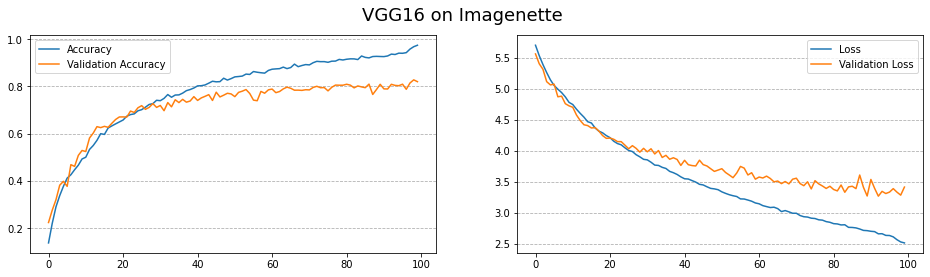

In [28]:
acc, val_acc = vgg_history.history['accuracy'], vgg_history.history['val_accuracy']
loss, val_loss = vgg_history.history['loss'], vgg_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('VGG16 on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

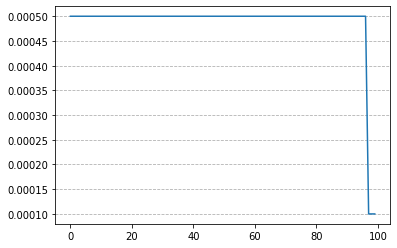

In [29]:
plt.plot(vgg_history.history['lr'])
plt.grid(axis='y', linestyle='--')

# ResNet

In [30]:
# Also known as a Residual Block
def identity_block(layer_in, filter_num):
    # To stay true to the paper, we'll apply batch norm before the activation layer
    # This isn't necessary and there's debate in the field as to whether it should be
    # applied before or after activation - with no clear winner.
    conv1 = keras.layers.Conv2D(filter_num, (1, 1), padding='same')(layer_in)
    batch_norm = keras.layers.BatchNormalization()(conv1)
    relu = keras.layers.Activation('relu')(batch_norm)
    
    conv2 = keras.layers.Conv2D(filter_num, (3, 3), padding='same')(relu)
    batch_norm = keras.layers.BatchNormalization()(conv2)
    relu = keras.layers.Activation('relu')(batch_norm)

    conv3 = keras.layers.Conv2D(filter_num*4, (1, 1), padding='same')(relu)
    batch_norm = keras.layers.BatchNormalization()(conv3)
    
    # Add layer_in to the last layer - this is the skip connection!
    add = keras.layers.Add()([layer_in, batch_norm])
    out = keras.layers.Activation('relu')(add)
    return out

In [31]:
def conv_identity_block(layer_in, filter_num):
    conv1 = keras.layers.Conv2D(filter_num, (1, 1), strides=(2, 2), padding='same')(layer_in)
    batch_norm = keras.layers.BatchNormalization()(conv1)
    relu = keras.layers.Activation('relu')(batch_norm)
    
    conv2 = keras.layers.Conv2D(filter_num, (3, 3), padding='same')(relu)
    batch_norm = keras.layers.BatchNormalization()(conv2)
    relu = keras.layers.Activation('relu')(batch_norm)

    conv3 = keras.layers.Conv2D(filter_num*4, (1, 1), padding='same')(relu)
    batch_norm = keras.layers.BatchNormalization()(conv3)
    
    shortcut = keras.layers.Conv2D(filter_num*4, (1, 1), strides=(2,2))(layer_in)
    shortcut = keras.layers.BatchNormalization()(shortcut)
    
    add = keras.layers.Add()([shortcut, batch_norm])
    out = keras.layers.Activation('relu')(add)
    return out

In [32]:
def conv_identity_block_d(layer_in, filter_num):
    conv1 = keras.layers.Conv2D(filter_num, (1, 1), strides=(1, 1), padding='same')(layer_in)
    batch_norm = keras.layers.BatchNormalization()(conv1)
    relu = keras.layers.Activation('relu')(batch_norm)
    
    conv2 = keras.layers.Conv2D(filter_num, (3, 3), strides=(2, 2), padding='same')(relu)
    batch_norm = keras.layers.BatchNormalization()(conv2)
    relu = keras.layers.Activation('relu')(batch_norm)

    conv3 = keras.layers.Conv2D(filter_num*4, (1, 1), padding='same')(relu)
    # Zero gamma initialization as per Tong He et al.
    batch_norm = keras.layers.BatchNormalization(gamma_initializer='zeros')(conv3)
    
    # ResNet-D tweak
    shortcut = keras.layers.AveragePooling2D((2, 2), strides=2, padding='same')(layer_in)
    # Set strides=(2, 2) if you don't use GAP before this
    shortcut = keras.layers.Conv2D(filter_num*4, (1, 1), strides=(1, 1))(shortcut)
    shortcut = keras.layers.BatchNormalization()(shortcut)
    
    add = keras.layers.Add()([shortcut, batch_norm])
    out = keras.layers.Activation('relu')(add)
    return out

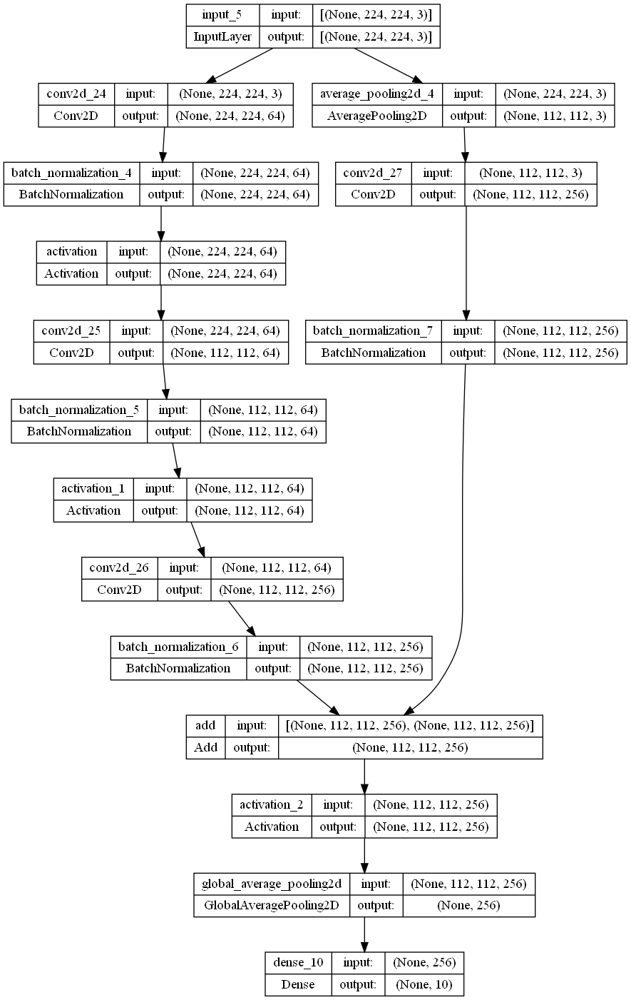

In [33]:
input_layer = keras.layers.Input(shape=[224, 224, 3])

x = conv_identity_block_d(input_layer, 64)

x = keras.layers.GlobalAveragePooling2D()(x)
output_layer = keras.layers.Dense(n_classes, activation='softmax')(x)

resnet = keras.Model(inputs=input_layer, outputs=output_layer)

tf.keras.utils.plot_model(resnet, to_file='resnet_singleblock.png', show_shapes=True)

In [34]:
def resnet50():
    input_layer = keras.layers.Input(shape=[None, None, 3])
    
    preprocess = keras.layers.experimental.preprocessing.Resizing(224, 224)(input_layer)
    preprocess = keras.layers.experimental.preprocessing.RandomRotation(0.1)(preprocess)
    preprocess = keras.layers.experimental.preprocessing.RandomFlip("horizontal")(preprocess)
    preprocess = keras.layers.experimental.preprocessing.RandomContrast(0.1)(preprocess)

    x = keras.layers.ZeroPadding2D(padding=(3, 3))(preprocess)
    x = keras.layers.Conv2D(64, (7, 7), strides=(2, 2), padding='valid')(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation('relu')(x)
    x = keras.layers.ZeroPadding2D(padding=(1, 1))(x)
    x = keras.layers.MaxPooling2D((3, 3), strides=(2, 2))(x)

    x = conv_identity_block(x, 64)
    x = identity_block(x, 64)
    x = identity_block(x, 64)

    x = conv_identity_block(x, 128)
    x = identity_block(x, 128)
    x = identity_block(x, 128)
    x = identity_block(x, 128)

    x = conv_identity_block(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)

    x = conv_identity_block(x, 512)
    x = identity_block(x, 512)
    x = identity_block(x, 512)

    x = keras.layers.GlobalAveragePooling2D()(x)
    output_layer = keras.layers.Dense(n_classes, activation='softmax')(x)

    return keras.Model(inputs=input_layer, outputs=output_layer)

resnet = resnet50()

#resnet = keras.applications.ResNet50(weights=None, classes=n_classes)

In [35]:
def identity_block_b(layer_in, filter_num):   
    conv1 = keras.layers.Conv2D(filter_num, (1, 1), padding='same')(layer_in)
    batch_norm = keras.layers.BatchNormalization()(conv1)
    relu = keras.layers.Activation('relu')(batch_norm)
    
    conv2 = keras.layers.Conv2D(filter_num, (3, 3), padding='same')(relu)
    batch_norm = keras.layers.BatchNormalization()(conv2)
    relu = keras.layers.Activation('relu')(batch_norm)

    conv3 = keras.layers.Conv2D(filter_num*4, (1, 1), padding='same')(relu)
    batch_norm = keras.layers.BatchNormalization()(conv3)
    
    add = keras.layers.Add()([layer_in, batch_norm])
    out = keras.layers.Activation('relu')(add)
    return out

In [36]:
resnet.compile(loss='sparse_categorical_crossentropy', 
              optimizer=keras.optimizers.Adam(learning_rate=1e-3),
              metrics=['accuracy'])

resnet.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 resizing_4 (Resizing)          (None, 224, 224, 3)  0           ['input_6[0][0]']                
                                                                                                  
 random_rotation_2 (RandomRotat  (None, 224, 224, 3)  0          ['resizing_4[0][0]']             
 ion)                                                                                             
                                                                                            

 activation_9 (Activation)      (None, 28, 28, 256)  0           ['add_2[0][0]']                  
                                                                                                  
 conv2d_36 (Conv2D)             (None, 28, 28, 64)   16448       ['activation_9[0][0]']           
                                                                                                  
 batch_normalization_16 (BatchN  (None, 28, 28, 64)  256         ['conv2d_36[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_10 (Activation)     (None, 28, 28, 64)   0           ['batch_normalization_16[0][0]'] 
                                                                                                  
 conv2d_37 (Conv2D)             (None, 28, 28, 64)   36928       ['activation_10[0][0]']          
          

                                                                                                  
 activation_19 (Activation)     (None, 14, 14, 128)  0           ['batch_normalization_26[0][0]'] 
                                                                                                  
 conv2d_47 (Conv2D)             (None, 14, 14, 128)  147584      ['activation_19[0][0]']          
                                                                                                  
 batch_normalization_27 (BatchN  (None, 14, 14, 128)  512        ['conv2d_47[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_20 (Activation)     (None, 14, 14, 128)  0           ['batch_normalization_27[0][0]'] 
                                                                                                  
 conv2d_48

 ormalization)                                                                                    
                                                                                                  
 activation_29 (Activation)     (None, 7, 7, 256)    0           ['batch_normalization_37[0][0]'] 
                                                                                                  
 conv2d_58 (Conv2D)             (None, 7, 7, 1024)   263168      ['activation_29[0][0]']          
                                                                                                  
 batch_normalization_38 (BatchN  (None, 7, 7, 1024)  4096        ['conv2d_58[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 add_9 (Add)                    (None, 7, 7, 1024)   0           ['activation_27[0][0]',          
          

                                                                                                  
 activation_39 (Activation)     (None, 7, 7, 1024)   0           ['add_12[0][0]']                 
                                                                                                  
 conv2d_68 (Conv2D)             (None, 7, 7, 256)    262400      ['activation_39[0][0]']          
                                                                                                  
 batch_normalization_48 (BatchN  (None, 7, 7, 256)   1024        ['conv2d_68[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_40 (Activation)     (None, 7, 7, 256)    0           ['batch_normalization_48[0][0]'] 
                                                                                                  
 conv2d_69

 ormalization)                                                                                    
                                                                                                  
 activation_49 (Activation)     (None, 4, 4, 512)    0           ['batch_normalization_58[0][0]'] 
                                                                                                  
 conv2d_79 (Conv2D)             (None, 4, 4, 512)    2359808     ['activation_49[0][0]']          
                                                                                                  
 batch_normalization_59 (BatchN  (None, 4, 4, 512)   2048        ['conv2d_79[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_50 (Activation)     (None, 4, 4, 512)    0           ['batch_normalization_59[0][0]'] 
          

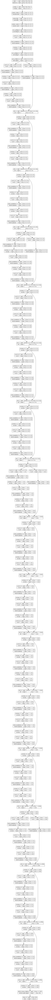

In [37]:
tf.keras.utils.plot_model(resnet, to_file='resnet.png', show_shapes=True)

In [38]:
reduceLR = keras.callbacks.ReduceLROnPlateau(patience=5, factor=0.7)
early_stopping = keras.callbacks.EarlyStopping(patience=15, monitor='val_accuracy', restore_best_weights=True)


resnet_history = resnet.fit(train_set, 
                        epochs=100,
                        callbacks=[reduceLR, early_stopping],
                        validation_data=valid_set)

Epoch 1/100
415/415 [==============================] - 83s 186ms/step - loss: 2.2733 - accuracy: 0.2980 - val_loss: 9.1459 - val_accuracy: 0.2158 - lr: 0.0010
Epoch 2/100
415/415 [==============================] - 75s 181ms/step - loss: 1.6817 - accuracy: 0.4256 - val_loss: 2.1750 - val_accuracy: 0.3536 - lr: 0.0010
Epoch 3/100
415/415 [==============================] - 75s 181ms/step - loss: 1.5488 - accuracy: 0.4890 - val_loss: 1.8724 - val_accuracy: 0.3827 - lr: 0.0010
Epoch 4/100
415/415 [==============================] - 75s 181ms/step - loss: 1.4511 - accuracy: 0.5222 - val_loss: 5.0695 - val_accuracy: 0.1679 - lr: 0.0010
Epoch 5/100
415/415 [==============================] - 75s 182ms/step - loss: 1.4502 - accuracy: 0.5260 - val_loss: 1.8964 - val_accuracy: 0.4048 - lr: 0.0010
Epoch 6/100
415/415 [==============================] - 75s 181ms/step - loss: 1.3786 - accuracy: 0.5582 - val_loss: 2.7853 - val_accuracy: 0.3434 - lr: 0.0010
Epoch 7/100
415/415 [=========================

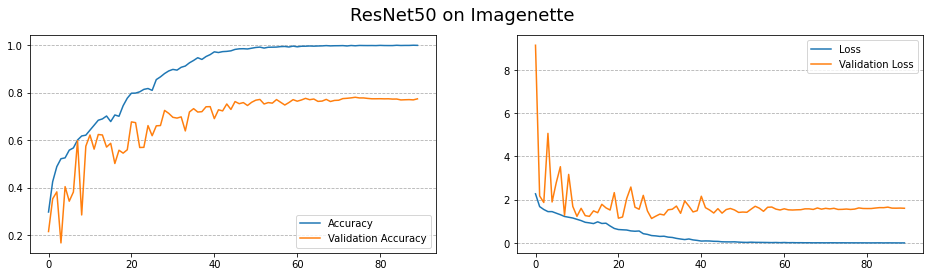

In [39]:
acc, val_acc = resnet_history.history['accuracy'], resnet_history.history['val_accuracy']
loss, val_loss = resnet_history.history['loss'], resnet_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('ResNet50 on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

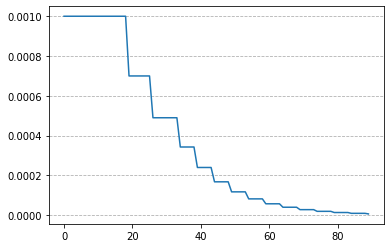

In [40]:
plt.plot(resnet_history.history['lr'])
plt.grid(axis='y', linestyle='--')

# Bag of Tricks

In [41]:
class LRSchedule(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, post_warmup_learning_rate, warmup_steps):
        super().__init__()
        self.post_warmup_learning_rate = post_warmup_learning_rate
        self.warmup_steps = warmup_steps

    def __call__(self, step):
        global_step = tf.cast(step, tf.float32)
        warmup_steps = tf.cast(self.warmup_steps, tf.float32)
        warmup_progress = global_step / warmup_steps
        warmup_learning_rate = self.post_warmup_learning_rate * warmup_progress
        return tf.cond(
            global_step < warmup_steps,
            lambda: warmup_learning_rate,
            lambda: self.post_warmup_learning_rate,
        )

In [42]:
def resnet50_tweaked():
    input_layer = keras.layers.Input(shape=[None, None, 3])
    
    preprocess = keras.layers.experimental.preprocessing.Resizing(224, 224)(input_layer)
    preprocess = keras.layers.experimental.preprocessing.RandomRotation(0.1)(preprocess)
    preprocess = keras.layers.experimental.preprocessing.RandomFlip("horizontal")(preprocess)
    preprocess = keras.layers.experimental.preprocessing.RandomContrast(0.1)(preprocess)

    x = keras.layers.ZeroPadding2D(padding=(3, 3))(preprocess)
    x = keras.layers.Conv2D(32, (3, 3), strides=(2, 2))(x)
    x = keras.layers.Conv2D(32, (3, 3), strides=(1, 1))(x)
    x = keras.layers.Conv2D(64, (3, 3), strides=(1, 1))(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation('relu')(x)
    x = keras.layers.ZeroPadding2D(padding=(1, 1))(x)
    x = keras.layers.MaxPooling2D((3, 3), strides=(2, 2))(x)

    x = conv_identity_block_d(x, 64)
    x = identity_block(x, 64)
    x = identity_block(x, 64)

    x = conv_identity_block_d(x, 128)
    x = identity_block(x, 128)
    x = identity_block(x, 128)
    x = identity_block(x, 128)

    x = conv_identity_block_d(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)
    x = identity_block(x, 256)

    x = conv_identity_block_d(x, 512)
    x = identity_block(x, 512)
    x = identity_block(x, 512)

    x = keras.layers.GlobalAveragePooling2D()(x)
    output_layer = keras.layers.Dense(n_classes, activation='softmax')(x)

    return keras.Model(inputs=input_layer, outputs=output_layer)

resnet_tweaked = resnet50_tweaked()

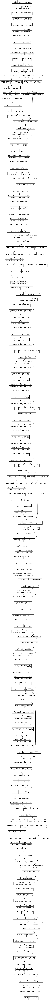

In [43]:
tf.keras.utils.plot_model(resnet_tweaked, to_file='resnet_tweaked.png', show_shapes=True)

# Xception

In [44]:
def conv_batch_relu(x, filters: int, kernel_size: tuple, strides=(1, 1), padding="same"):
    x = keras.layers.SeparableConv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding=padding)(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("relu")(x)
    return x
    
def conv_batch(x, filters: int, kernel_size: tuple, strides=(1, 1), padding="same"):
    x = keras.layers.SeparableConv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding=padding)(x)
    x = keras.layers.BatchNormalization()(x)
    return x

def skip_block(x, filters: int, kernel_size: tuple, strides=(1, 1), padding="same"):
    x = keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=strides, padding=padding)(x)
    x = keras.layers.BatchNormalization()(x)
    return x

In [45]:
def get_xception():
    input_layer = keras.layers.Input(shape=[None, None, 3])
    
    preprocess = keras.layers.experimental.preprocessing.RandomRotation(0.1)(input_layer)
    preprocess = keras.layers.experimental.preprocessing.RandomFlip("horizontal")(preprocess)
    preprocess = keras.layers.experimental.preprocessing.RandomContrast(0.1)(preprocess)
    
    x = conv_batch_relu(preprocess, 32, (3, 3), strides=(2, 2))
    x = conv_batch(x, 64, (3, 3))
    
    skip_connection = skip_block(x, filters=128, kernel_size=(1, 1), strides=(2, 2), padding="same")
    
    x = conv_batch_relu(x, 128, (3, 3))
    x = conv_batch(x, 128, (3, 3))
    
    x = keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding="same")(x)
    x = keras.layers.Add()([x, skip_connection])
    
    skip_connection = skip_block(x, filters=256, kernel_size=(1, 1), strides=(2, 2), padding="same")
    
    x = keras.layers.Activation("relu")(x)
    x = conv_batch_relu(x, 256, (3, 3))
    x = conv_batch(x, 256, (3, 3))

    x = keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding="same")(x)
    x = keras.layers.Add()([x, skip_connection])
    
    skip_connection = skip_block(x, filters=728, kernel_size=(1, 1), strides=(2, 2), padding="same")
    
    x = keras.layers.Activation("relu")(x)
    x = conv_batch_relu(x, 728, (3, 3))
    x = conv_batch(x, 728, (3, 3))
    
    x = keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding="same")(x)
    x = keras.layers.Add()([x, skip_connection])
    
    for i in range(8):
        skip_connection = x
        x = keras.layers.Activation("relu")(x)
        x = conv_batch_relu(x, 728, (3, 3))
        x = conv_batch_relu(x, 728, (3, 3))
        x = conv_batch(x, 728, (3, 3))
        x = keras.layers.Add()([x, skip_connection])
    
    skip_connection = skip_block(x, filters=1024, kernel_size=(1, 1), strides=(2, 2), padding="same")
    
    x = keras.layers.Activation("relu")(x)
    x = conv_batch_relu(x, 728, (3, 3))
    x = conv_batch(x, 1024, (3, 3))
    
    x = keras.layers.MaxPooling2D((3, 3), strides=(2, 2), padding="same")(x)
    x = keras.layers.Add()([x, skip_connection])
    
    x = conv_batch_relu(x, 1536, (3, 3))
    x = conv_batch_relu(x, 2048, (3, 3))
                                   
    x = keras.layers.GlobalAveragePooling2D()(x)
    output_layer = keras.layers.Dense(n_classes, activation='softmax')(x)
    
    return keras.Model(inputs=input_layer, outputs=output_layer)

xception = get_xception()
# Or
# xception = keras.applications.Xception(weights=None, classes=n_classes)

In [46]:
xception.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 random_rotation_4 (RandomRotat  (None, None, None,   0          ['input_8[0][0]']                
 ion)                           3)                                                                
                                                                                                  
 random_flip_5 (RandomFlip)     (None, None, None,   0           ['random_rotation_4[0][0]']      
                                3)                                                          

                                                                                                  
 add_34 (Add)                   (None, None, None,   0           ['max_pooling2d_11[0][0]',       
                                256)                              'batch_normalization_119[0][0]']
                                                                                                  
 activation_105 (Activation)    (None, None, None,   0           ['add_34[0][0]']                 
                                256)                                                              
                                                                                                  
 separable_conv2d_6 (SeparableC  (None, None, None,   189400     ['activation_105[0][0]']         
 onv2D)                         728)                                                              
                                                                                                  
 batch_nor

                                728)                                                              
                                                                                                  
 separable_conv2d_13 (Separable  (None, None, None,   537264     ['activation_112[0][0]']         
 Conv2D)                        728)                                                              
                                                                                                  
 batch_normalization_130 (Batch  (None, None, None,   2912       ['separable_conv2d_13[0][0]']    
 Normalization)                 728)                                                              
                                                                                                  
 add_37 (Add)                   (None, None, None,   0           ['batch_normalization_130[0][0]',
                                728)                              'add_36[0][0]']                 
          

 separable_conv2d_21 (Separable  (None, None, None,   537264     ['activation_120[0][0]']         
 Conv2D)                        728)                                                              
                                                                                                  
 batch_normalization_138 (Batch  (None, None, None,   2912       ['separable_conv2d_21[0][0]']    
 Normalization)                 728)                                                              
                                                                                                  
 activation_121 (Activation)    (None, None, None,   0           ['batch_normalization_138[0][0]']
                                728)                                                              
                                                                                                  
 separable_conv2d_22 (Separable  (None, None, None,   537264     ['activation_121[0][0]']         
 Conv2D)  

                                                                                                  
 batch_normalization_146 (Batch  (None, None, None,   2912       ['separable_conv2d_29[0][0]']    
 Normalization)                 728)                                                              
                                                                                                  
 activation_129 (Activation)    (None, None, None,   0           ['batch_normalization_146[0][0]']
                                728)                                                              
                                                                                                  
 separable_conv2d_30 (Separable  (None, None, None,   537264     ['activation_129[0][0]']         
 Conv2D)                        728)                                                              
                                                                                                  
 batch_nor

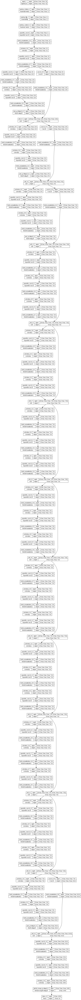

In [47]:
tf.keras.utils.plot_model(xception, to_file='xception.png', show_shapes=True)

In [48]:
(train_set_x, test_set_x, valid_set_x), info = tfds.load("imagenette", 
                                           split=["train[:70%]", "train[70%:]", "validation"],
                                           as_supervised=True, with_info=True)

class_names = info.features["label"].names
n_classes = info.features["label"].num_classes

def preprocess_image(image, label):
    #cropped_image = tf.image.central_crop(image, 0.7)
    resized_image = tf.image.resize(image, [299, 299])
    return resized_image, label

train_set_x = train_set_x.map(preprocess_image).batch(8).prefetch(tf.data.AUTOTUNE)
test_set_x = test_set_x.map(preprocess_image).batch(8).prefetch(tf.data.AUTOTUNE)
valid_set_x = valid_set_x.map(preprocess_image).batch(8).prefetch(tf.data.AUTOTUNE)

In [49]:
# Original paper used a scheduler with a factor of 0.94
# every two epochs
def scheduler(epoch, lr):
    if (epoch % 2) == 0 and epoch != 0:
        return lr * 0.94
    else:
        return lr

reduceLR = keras.callbacks.ReduceLROnPlateau(patience=10)
early_stopping = keras.callbacks.EarlyStopping(patience=15, monitor='val_accuracy', restore_best_weights=True)

xception.compile(loss='sparse_categorical_crossentropy', 
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

xception_history = xception.fit(train_set_x, 
                        epochs=100, 
                        validation_data=valid_set_x, 
                        callbacks=[reduceLR, early_stopping])

Epoch 1/100
829/829 [==============================] - 335s 397ms/step - loss: 2.0637 - accuracy: 0.2681 - val_loss: 2.0493 - val_accuracy: 0.3287 - lr: 0.0010
Epoch 2/100
829/829 [==============================] - 328s 396ms/step - loss: 1.7369 - accuracy: 0.3885 - val_loss: 1.7901 - val_accuracy: 0.4436 - lr: 0.0010
Epoch 3/100
829/829 [==============================] - 330s 398ms/step - loss: 1.5165 - accuracy: 0.4903 - val_loss: 1.5665 - val_accuracy: 0.4989 - lr: 0.0010
Epoch 4/100
829/829 [==============================] - 328s 396ms/step - loss: 1.3404 - accuracy: 0.5537 - val_loss: 1.3505 - val_accuracy: 0.5552 - lr: 0.0010
Epoch 5/100
829/829 [==============================] - 328s 396ms/step - loss: 1.1816 - accuracy: 0.6079 - val_loss: 1.2302 - val_accuracy: 0.5967 - lr: 0.0010
Epoch 6/100
829/829 [==============================] - 328s 395ms/step - loss: 1.0635 - accuracy: 0.6531 - val_loss: 1.0879 - val_accuracy: 0.6479 - lr: 0.0010
Epoch 7/100
829/829 [===================

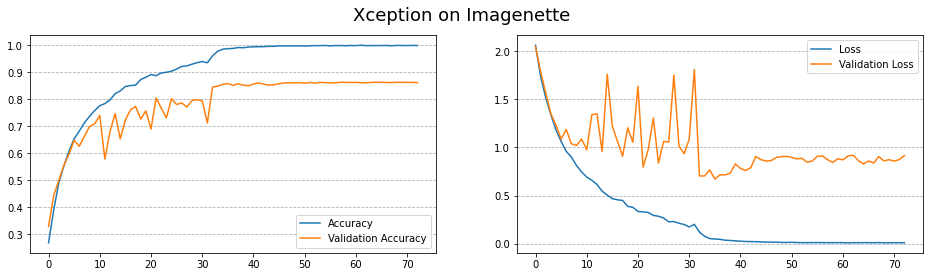

In [50]:
acc, val_acc = xception_history.history['accuracy'], xception_history.history['val_accuracy']
loss, val_loss = xception_history.history['loss'], xception_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('Xception on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

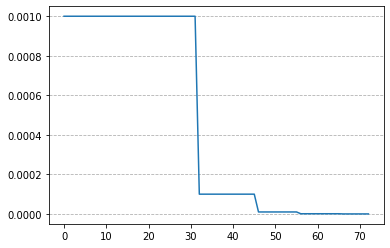

In [51]:
plt.plot(xception_history.history['lr'])
plt.grid(axis='y', linestyle='--')

# DenseNet

In [52]:
def h(input_layer, filters, strides=(1, 1), padding="same", bottleneck=True):
    if bottleneck:
        # DenseNet-B addition (Bottleneck)
        x = keras.layers.BatchNormalization()(input_layer)
        x = keras.layers.Activation("relu")(x)
        x = keras.layers.Conv2D(filters=4*filters, kernel_size=(1, 1), strides=strides)(x)
        
        x = keras.layers.BatchNormalization()(x)
        x = keras.layers.Activation("relu")(x)
        x = keras.layers.Conv2D(filters=filters, kernel_size=(3, 3), strides=strides, padding=padding)(x)
    else:
        x = keras.layers.BatchNormalization()(input_layer)
        x = keras.layers.Activation("relu")(x)
        x = keras.layers.Conv2D(filters=filters, kernel_size=(3, 3), strides=strides, padding=padding)(x)
    
    # This is where the magic happens! This layer is concatenated
    # onto the previous layer's output, which is concatenated onto
    # the previous layer's output... and so on
    x = keras.layers.Concatenate()([x, input_layer])
    return x

def dense_block(x, n_blocks, filters=32):
    for i in range(n_blocks):
        x = h(x, filters)
    return x

def transition_layer(input_layer, reduction=1):
    x = keras.layers.BatchNormalization()(input_layer)
    x = keras.layers.Activation('relu')(x)
    
    # Compression - DenseNet-C
    m = input_layer.shape[1]
    compressed = int(reduction*m)
    x = keras.layers.Conv2D(compressed, kernel_size=(1, 1))(x)
    
    x = keras.layers.AveragePooling2D(2, strides=(2, 2))(x)
    return x



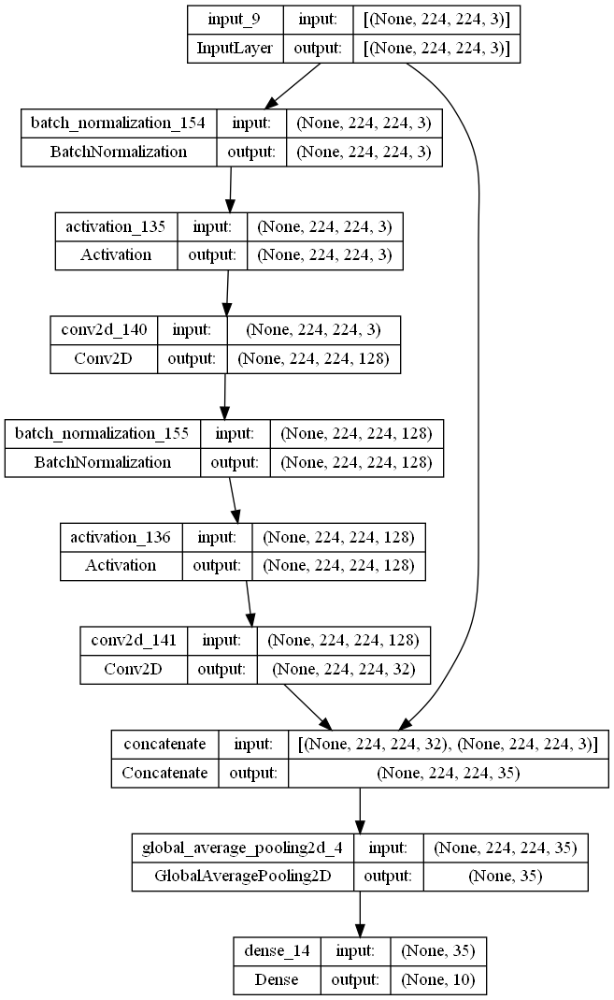

In [53]:
input_layer = keras.layers.Input(shape=[224, 224, 3])

x = dense_block(input_layer, 1)

x = keras.layers.GlobalAveragePooling2D()(x)
output_layer = keras.layers.Dense(n_classes, activation='softmax')(x)

densenet_block = keras.Model(inputs=input_layer, outputs=output_layer)

tf.keras.utils.plot_model(densenet_block, to_file='densenet_singleblock.png', show_shapes=True)

In [54]:
# Since we're using both DenseNet-B and DenseNet-C Additions, we're
# effectively building DenseNet-BC here
def get_densenet():
    input_layer = keras.layers.Input(shape=[None, None, 3])
    
    preprocess = keras.layers.experimental.preprocessing.Resizing(224, 224)(input_layer)
    preprocess = keras.layers.experimental.preprocessing.RandomRotation(0.1)(preprocess)
    preprocess = keras.layers.experimental.preprocessing.RandomFlip("horizontal")(preprocess)
    preprocess = keras.layers.experimental.preprocessing.RandomContrast(0.1)(preprocess)

    x = keras.layers.BatchNormalization()(preprocess)
    x = keras.layers.Activation('relu')(x)
    x = keras.layers.Conv2D(128, kernel_size=(7, 7), strides=(2, 2), padding='same')(x)
    x = keras.layers.MaxPooling2D(3, strides=(2, 2), padding="same")(x)
    
    blocks = [6, 12, 24, 16]
    
    for block in blocks[:-1]:
        x = dense_block(x, block)
        x = transition_layer(x, reduction=0.5)
    x = dense_block(x, blocks[-1])

    x = keras.layers.GlobalAveragePooling2D()(x)
    output_layer = keras.layers.Dense(n_classes, activation='softmax')(x)
    
    return keras.Model(inputs=input_layer, outputs=output_layer)

densenet = get_densenet()

In [55]:
#densenet = keras.applications.DenseNet121(weights=None, classes=n_classes)

In [56]:
densenet.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_10 (InputLayer)          [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 resizing_6 (Resizing)          (None, 224, 224, 3)  0           ['input_10[0][0]']               
                                                                                                  
 random_rotation_5 (RandomRotat  (None, 224, 224, 3)  0          ['resizing_6[0][0]']             
 ion)                                                                                             
                                                                                            

 conv2d_149 (Conv2D)            (None, 56, 56, 128)  28800       ['activation_144[0][0]']         
                                                                                                  
 batch_normalization_164 (Batch  (None, 56, 56, 128)  512        ['conv2d_149[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_145 (Activation)    (None, 56, 56, 128)  0           ['batch_normalization_164[0][0]']
                                                                                                  
 conv2d_150 (Conv2D)            (None, 56, 56, 32)   36896       ['activation_145[0][0]']         
                                                                                                  
 concatenate_4 (Concatenate)    (None, 56, 56, 256)  0           ['conv2d_150[0][0]',             
          

 activation_154 (Activation)    (None, 28, 28, 128)  0           ['batch_normalization_173[0][0]']
                                                                                                  
 conv2d_159 (Conv2D)            (None, 28, 28, 32)   36896       ['activation_154[0][0]']         
                                                                                                  
 concatenate_8 (Concatenate)    (None, 28, 28, 92)   0           ['conv2d_159[0][0]',             
                                                                  'concatenate_7[0][0]']          
                                                                                                  
 batch_normalization_174 (Batch  (None, 28, 28, 92)  368         ['concatenate_8[0][0]']          
 Normalization)                                                                                   
                                                                                                  
 activatio

 Normalization)                                                                                   
                                                                                                  
 activation_164 (Activation)    (None, 28, 28, 128)  0           ['batch_normalization_183[0][0]']
                                                                                                  
 conv2d_169 (Conv2D)            (None, 28, 28, 32)   36896       ['activation_164[0][0]']         
                                                                                                  
 concatenate_13 (Concatenate)   (None, 28, 28, 252)  0           ['conv2d_169[0][0]',             
                                                                  'concatenate_12[0][0]']         
                                                                                                  
 batch_normalization_184 (Batch  (None, 28, 28, 252)  1008       ['concatenate_13[0][0]']         
 Normaliza

                                                                                                  
 batch_normalization_193 (Batch  (None, 28, 28, 128)  512        ['conv2d_178[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_174 (Activation)    (None, 28, 28, 128)  0           ['batch_normalization_193[0][0]']
                                                                                                  
 conv2d_179 (Conv2D)            (None, 28, 28, 32)   36896       ['activation_174[0][0]']         
                                                                                                  
 concatenate_18 (Concatenate)   (None, 28, 28, 412)  0           ['conv2d_179[0][0]',             
                                                                  'concatenate_17[0][0]']         
          

                                                                                                  
 conv2d_188 (Conv2D)            (None, 14, 14, 32)   36896       ['activation_183[0][0]']         
                                                                                                  
 concatenate_22 (Concatenate)   (None, 14, 14, 142)  0           ['conv2d_188[0][0]',             
                                                                  'concatenate_21[0][0]']         
                                                                                                  
 batch_normalization_203 (Batch  (None, 14, 14, 142)  568        ['concatenate_22[0][0]']         
 Normalization)                                                                                   
                                                                                                  
 activation_184 (Activation)    (None, 14, 14, 142)  0           ['batch_normalization_203[0][0]']
          

                                                                                                  
 activation_193 (Activation)    (None, 14, 14, 128)  0           ['batch_normalization_212[0][0]']
                                                                                                  
 conv2d_198 (Conv2D)            (None, 14, 14, 32)   36896       ['activation_193[0][0]']         
                                                                                                  
 concatenate_27 (Concatenate)   (None, 14, 14, 302)  0           ['conv2d_198[0][0]',             
                                                                  'concatenate_26[0][0]']         
                                                                                                  
 batch_normalization_213 (Batch  (None, 14, 14, 302)  1208       ['concatenate_27[0][0]']         
 Normalization)                                                                                   
          

 batch_normalization_222 (Batch  (None, 14, 14, 128)  512        ['conv2d_207[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_203 (Activation)    (None, 14, 14, 128)  0           ['batch_normalization_222[0][0]']
                                                                                                  
 conv2d_208 (Conv2D)            (None, 14, 14, 32)   36896       ['activation_203[0][0]']         
                                                                                                  
 concatenate_32 (Concatenate)   (None, 14, 14, 462)  0           ['conv2d_208[0][0]',             
                                                                  'concatenate_31[0][0]']         
                                                                                                  
 batch_nor

 conv2d_217 (Conv2D)            (None, 14, 14, 128)  75648       ['activation_212[0][0]']         
                                                                                                  
 batch_normalization_232 (Batch  (None, 14, 14, 128)  512        ['conv2d_217[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_213 (Activation)    (None, 14, 14, 128)  0           ['batch_normalization_232[0][0]']
                                                                                                  
 conv2d_218 (Conv2D)            (None, 14, 14, 32)   36896       ['activation_213[0][0]']         
                                                                                                  
 concatenate_37 (Concatenate)   (None, 14, 14, 622)  0           ['conv2d_218[0][0]',             
          

 activation_222 (Activation)    (None, 14, 14, 750)  0           ['batch_normalization_241[0][0]']
                                                                                                  
 conv2d_227 (Conv2D)            (None, 14, 14, 128)  96128       ['activation_222[0][0]']         
                                                                                                  
 batch_normalization_242 (Batch  (None, 14, 14, 128)  512        ['conv2d_227[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_223 (Activation)    (None, 14, 14, 128)  0           ['batch_normalization_242[0][0]']
                                                                                                  
 conv2d_228 (Conv2D)            (None, 14, 14, 32)   36896       ['activation_223[0][0]']         
          

 Normalization)                                                                                   
                                                                                                  
 activation_232 (Activation)    (None, 7, 7, 128)    0           ['batch_normalization_251[0][0]']
                                                                                                  
 conv2d_237 (Conv2D)            (None, 7, 7, 32)     36896       ['activation_232[0][0]']         
                                                                                                  
 concatenate_46 (Concatenate)   (None, 7, 7, 135)    0           ['conv2d_237[0][0]',             
                                                                  'concatenate_45[0][0]']         
                                                                                                  
 batch_normalization_252 (Batch  (None, 7, 7, 135)   540         ['concatenate_46[0][0]']         
 Normaliza

                                                                                                  
 batch_normalization_261 (Batch  (None, 7, 7, 128)   512         ['conv2d_246[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_242 (Activation)    (None, 7, 7, 128)    0           ['batch_normalization_261[0][0]']
                                                                                                  
 conv2d_247 (Conv2D)            (None, 7, 7, 32)     36896       ['activation_242[0][0]']         
                                                                                                  
 concatenate_51 (Concatenate)   (None, 7, 7, 295)    0           ['conv2d_247[0][0]',             
                                                                  'concatenate_50[0][0]']         
          

                                                                                                  
 conv2d_256 (Conv2D)            (None, 7, 7, 128)    54272       ['activation_251[0][0]']         
                                                                                                  
 batch_normalization_271 (Batch  (None, 7, 7, 128)   512         ['conv2d_256[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_252 (Activation)    (None, 7, 7, 128)    0           ['batch_normalization_271[0][0]']
                                                                                                  
 conv2d_257 (Conv2D)            (None, 7, 7, 32)     36896       ['activation_252[0][0]']         
                                                                                                  
 concatena

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.690719 to fit



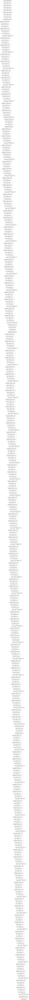

In [57]:
tf.keras.utils.plot_model(densenet, to_file='densenet.png', show_shapes=True)

In [58]:
reduceLR = keras.callbacks.ReduceLROnPlateau(patience=10, factor=0.3)
early_stopping = keras.callbacks.EarlyStopping(patience=15, monitor='val_accuracy', restore_best_weights=True)

densenet.compile(loss='sparse_categorical_crossentropy', 
              optimizer=keras.optimizers.Adam(),
              metrics=['accuracy'])

densenet_history = densenet.fit(train_set, 
                        epochs=100, 
                        validation_data=valid_set, 
                        callbacks=[reduceLR, early_stopping])

Epoch 1/100
415/415 [==============================] - 151s 331ms/step - loss: 2.3258 - accuracy: 0.2219 - val_loss: 2.2629 - val_accuracy: 0.2670 - lr: 0.0010
Epoch 2/100
415/415 [==============================] - 133s 319ms/step - loss: 1.9818 - accuracy: 0.3027 - val_loss: 2.3436 - val_accuracy: 0.2415 - lr: 0.0010
Epoch 3/100
415/415 [==============================] - 132s 317ms/step - loss: 1.9013 - accuracy: 0.3265 - val_loss: 2.0750 - val_accuracy: 0.3299 - lr: 0.0010
Epoch 4/100
415/415 [==============================] - 128s 310ms/step - loss: 1.8230 - accuracy: 0.3574 - val_loss: 3.9273 - val_accuracy: 0.2854 - lr: 0.0010
Epoch 5/100
415/415 [==============================] - 128s 309ms/step - loss: 1.7772 - accuracy: 0.3796 - val_loss: 1.7357 - val_accuracy: 0.4155 - lr: 0.0010
Epoch 6/100
415/415 [==============================] - 128s 309ms/step - loss: 1.6994 - accuracy: 0.4163 - val_loss: 1.6569 - val_accuracy: 0.4446 - lr: 0.0010
Epoch 7/100
415/415 [===================

Epoch 52/100
415/415 [==============================] - 128s 309ms/step - loss: 0.1238 - accuracy: 0.9608 - val_loss: 1.4643 - val_accuracy: 0.7320 - lr: 3.0000e-04
Epoch 53/100
415/415 [==============================] - 128s 309ms/step - loss: 0.0822 - accuracy: 0.9719 - val_loss: 1.4340 - val_accuracy: 0.7452 - lr: 9.0000e-05
Epoch 54/100
415/415 [==============================] - 127s 307ms/step - loss: 0.0698 - accuracy: 0.9771 - val_loss: 1.4854 - val_accuracy: 0.7447 - lr: 9.0000e-05
Epoch 55/100
415/415 [==============================] - 128s 310ms/step - loss: 0.0580 - accuracy: 0.9819 - val_loss: 1.5262 - val_accuracy: 0.7483 - lr: 9.0000e-05
Epoch 56/100
415/415 [==============================] - 128s 309ms/step - loss: 0.0604 - accuracy: 0.9820 - val_loss: 1.5595 - val_accuracy: 0.7470 - lr: 9.0000e-05
Epoch 57/100
415/415 [==============================] - 128s 308ms/step - loss: 0.0551 - accuracy: 0.9826 - val_loss: 1.6436 - val_accuracy: 0.7399 - lr: 9.0000e-05
Epoch 58/1

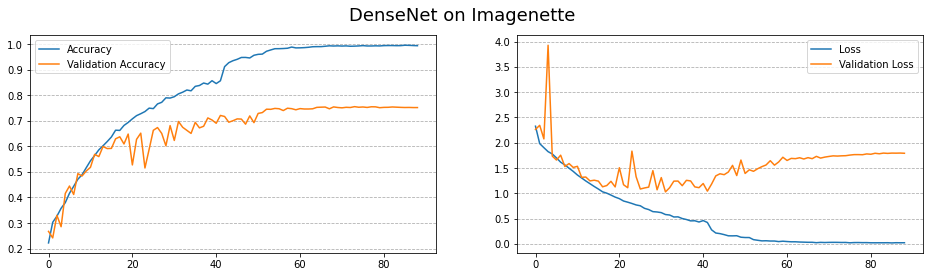

In [59]:
acc, val_acc = densenet_history.history['accuracy'], densenet_history.history['val_accuracy']
loss, val_loss = densenet_history.history['loss'], densenet_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('DenseNet on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

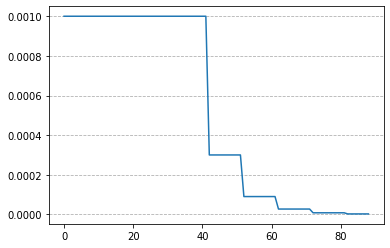

In [60]:
plt.plot(densenet_history.history['lr'])
plt.grid(axis='y', linestyle='--')

# EfficientNet

In [61]:
effnet = keras.applications.efficientnet_v2.EfficientNetV2B0(input_shape=(224,224,3), weights=None, classes=n_classes)

In [62]:
effnet.summary()

Model: "efficientnetv2-b0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_11 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_11[0][0]']               
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  0           ['rescaling[0][0]']              
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 32  864         ['normalization[0

                                                                                                  
 block3b_project_conv (Conv2D)  (None, 28, 28, 48)   9216        ['block3b_expand_activation[0][0]
                                                                 ']                               
                                                                                                  
 block3b_project_bn (BatchNorma  (None, 28, 28, 48)  192         ['block3b_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block3b_drop (Dropout)         (None, 28, 28, 48)   0           ['block3b_project_bn[0][0]']     
                                                                                                  
 block3b_add (Add)              (None, 28, 28, 48)   0           ['block3b_drop[0][0]',           
          

                                                                  'block4a_project_bn[0][0]']     
                                                                                                  
 block4c_expand_conv (Conv2D)   (None, 14, 14, 384)  36864       ['block4b_add[0][0]']            
                                                                                                  
 block4c_expand_bn (BatchNormal  (None, 14, 14, 384)  1536       ['block4c_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block4c_expand_activation (Act  (None, 14, 14, 384)  0          ['block4c_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block4c_d

 block5b_dwconv2 (DepthwiseConv  (None, 14, 14, 672)  6048       ['block5b_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block5b_bn (BatchNormalization  (None, 14, 14, 672)  2688       ['block5b_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block5b_activation (Activation  (None, 14, 14, 672)  0          ['block5b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5b_se_squeeze (GlobalAver  (None, 672)         0           ['block5b_activation[0][0]']     
 agePoolin

                                                                                                  
 block5d_activation (Activation  (None, 14, 14, 672)  0          ['block5d_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5d_se_squeeze (GlobalAver  (None, 672)         0           ['block5d_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5d_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block5d_se_squeeze[0][0]']     
                                                                                                  
 block5d_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block5d_se_reshape[0][0]']     
          

 agePooling2D)                                                                                    
                                                                                                  
 block6a_se_reshape (Reshape)   (None, 1, 1, 672)    0           ['block6a_se_squeeze[0][0]']     
                                                                                                  
 block6a_se_reduce (Conv2D)     (None, 1, 1, 28)     18844       ['block6a_se_reshape[0][0]']     
                                                                                                  
 block6a_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block6a_se_reduce[0][0]']      
                                                                                                  
 block6a_se_excite (Multiply)   (None, 7, 7, 672)    0           ['block6a_activation[0][0]',     
                                                                  'block6a_se_expand[0][0]']      
          

                                                                                                  
 block6c_project_conv (Conv2D)  (None, 7, 7, 192)    221184      ['block6c_se_excite[0][0]']      
                                                                                                  
 block6c_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6c_drop (Dropout)         (None, 7, 7, 192)    0           ['block6c_project_bn[0][0]']     
                                                                                                  
 block6c_add (Add)              (None, 7, 7, 192)    0           ['block6c_drop[0][0]',           
                                                                  'block6b_add[0][0]']            
          

                                                                                                  
 block6e_drop (Dropout)         (None, 7, 7, 192)    0           ['block6e_project_bn[0][0]']     
                                                                                                  
 block6e_add (Add)              (None, 7, 7, 192)    0           ['block6e_drop[0][0]',           
                                                                  'block6d_add[0][0]']            
                                                                                                  
 block6f_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6e_add[0][0]']            
                                                                                                  
 block6f_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block6f_expand_conv[0][0]']    
 ization)                                                                                         
          

                                                                                                  
 block6h_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6g_add[0][0]']            
                                                                                                  
 block6h_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block6h_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6h_expand_activation (Act  (None, 7, 7, 1152)  0           ['block6h_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6h_dwconv2 (DepthwiseConv  (None, 7, 7, 1152)  10368       ['block6h_expand_activation[0][0]
 2D)      

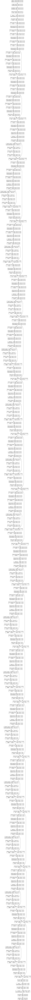

In [63]:
tf.keras.utils.plot_model(effnet, to_file='effnet.png', show_shapes=True)

In [64]:
reduceLR = keras.callbacks.ReduceLROnPlateau(patience=10, factor=0.3)
early_stopping = keras.callbacks.EarlyStopping(patience=15, monitor='val_accuracy', restore_best_weights=True)

effnet.compile(loss='sparse_categorical_crossentropy', 
              optimizer=keras.optimizers.Adam(decay=0.001),
              metrics=['accuracy'])

effnet_history = effnet.fit(train_set, 
                        epochs=100, 
                        validation_data=valid_set, 
                        callbacks=[reduceLR])

Epoch 1/100
415/415 [==============================] - 68s 144ms/step - loss: 2.6380 - accuracy: 0.2375 - val_loss: 2.2423 - val_accuracy: 0.3157 - lr: 0.0010
Epoch 2/100
415/415 [==============================] - 57s 138ms/step - loss: 1.8976 - accuracy: 0.3775 - val_loss: 1.8178 - val_accuracy: 0.5047 - lr: 0.0010
Epoch 3/100
415/415 [==============================] - 57s 138ms/step - loss: 1.5588 - accuracy: 0.4902 - val_loss: 1.4242 - val_accuracy: 0.5496 - lr: 0.0010
Epoch 4/100
415/415 [==============================] - 57s 138ms/step - loss: 1.2966 - accuracy: 0.5810 - val_loss: 1.4322 - val_accuracy: 0.5893 - lr: 0.0010
Epoch 5/100
415/415 [==============================] - 57s 138ms/step - loss: 1.0540 - accuracy: 0.6608 - val_loss: 1.3734 - val_accuracy: 0.6000 - lr: 0.0010
Epoch 6/100
415/415 [==============================] - 57s 138ms/step - loss: 0.7966 - accuracy: 0.7455 - val_loss: 1.5216 - val_accuracy: 0.5893 - lr: 0.0010
Epoch 7/100
415/415 [=========================

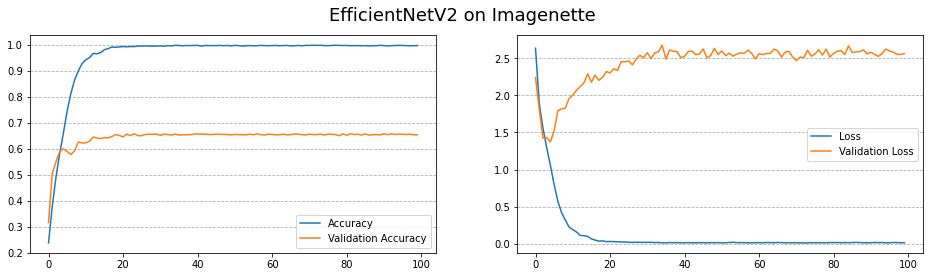

In [65]:
acc, val_acc = effnet_history.history['accuracy'], effnet_history.history['val_accuracy']
loss, val_loss = effnet_history.history['loss'], effnet_history.history['val_loss']
fig, ax = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('EfficientNetV2 on Imagenette', fontsize=18)

ax[0].plot(acc, label='Accuracy')
ax[0].plot(val_acc, label='Validation Accuracy')
ax[0].grid(axis='y', linestyle='--')

ax[1].plot(loss, label='Loss')
ax[1].plot(val_loss, label='Validation Loss')
ax[1].grid(axis='y', linestyle='--')

ax[0].legend()
ax[1].legend()
plt.show()

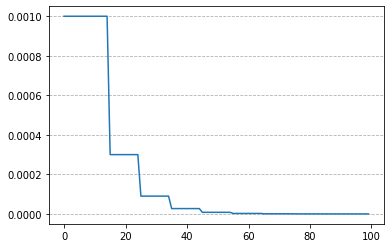

In [66]:
plt.plot(effnet_history.history['lr'])
plt.grid(axis='y', linestyle='--')

# EfficientNetV2M

In [69]:
effnetV2M = keras.applications.efficientnet_v2.EfficientNetV2M(input_shape=(224,224,3), weights=None, classes=n_classes)

In [70]:
effnetV2M.summary()

Model: "efficientnetv2-m"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_12 (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['input_12[0][0]']               
                                                                                                  
 stem_conv (Conv2D)             (None, 112, 112, 24  648         ['rescaling_1[0][0]']            
                                )                                                                 
                                                                                   

                                                                 ']                               
                                                                                                  
 block2b_project_bn (BatchNorma  (None, 56, 56, 48)  192         ['block2b_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block2b_drop (Dropout)         (None, 56, 56, 48)   0           ['block2b_project_bn[0][0]']     
                                                                                                  
 block2b_add (Add)              (None, 56, 56, 48)   0           ['block2b_drop[0][0]',           
                                                                  'block2a_project_bn[0][0]']     
                                                                                                  
 block2c_e

 block3b_expand_bn (BatchNormal  (None, 28, 28, 320)  1280       ['block3b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block3b_expand_activation (Act  (None, 28, 28, 320)  0          ['block3b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block3b_project_conv (Conv2D)  (None, 28, 28, 80)   25600       ['block3b_expand_activation[0][0]
                                                                 ']                               
                                                                                                  
 block3b_project_bn (BatchNorma  (None, 28, 28, 80)  320         ['block3b_project_conv[0][0]']   
 lization)

 2D)                                                             ']                               
                                                                                                  
 block4a_bn (BatchNormalization  (None, 14, 14, 320)  1280       ['block4a_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block4a_activation (Activation  (None, 14, 14, 320)  0          ['block4a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block4a_se_squeeze (GlobalAver  (None, 320)         0           ['block4a_activation[0][0]']     
 agePooling2D)                                                                                    
          

                                                                                                  
 block4c_se_reshape (Reshape)   (None, 1, 1, 640)    0           ['block4c_se_squeeze[0][0]']     
                                                                                                  
 block4c_se_reduce (Conv2D)     (None, 1, 1, 40)     25640       ['block4c_se_reshape[0][0]']     
                                                                                                  
 block4c_se_expand (Conv2D)     (None, 1, 1, 640)    26240       ['block4c_se_reduce[0][0]']      
                                                                                                  
 block4c_se_excite (Multiply)   (None, 14, 14, 640)  0           ['block4c_activation[0][0]',     
                                                                  'block4c_se_expand[0][0]']      
                                                                                                  
 block4c_p

 block4e_se_expand (Conv2D)     (None, 1, 1, 640)    26240       ['block4e_se_reduce[0][0]']      
                                                                                                  
 block4e_se_excite (Multiply)   (None, 14, 14, 640)  0           ['block4e_activation[0][0]',     
                                                                  'block4e_se_expand[0][0]']      
                                                                                                  
 block4e_project_conv (Conv2D)  (None, 14, 14, 160)  102400      ['block4e_se_excite[0][0]']      
                                                                                                  
 block4e_project_bn (BatchNorma  (None, 14, 14, 160)  640        ['block4e_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block4e_d

 block4g_project_conv (Conv2D)  (None, 14, 14, 160)  102400      ['block4g_se_excite[0][0]']      
                                                                                                  
 block4g_project_bn (BatchNorma  (None, 14, 14, 160)  640        ['block4g_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block4g_drop (Dropout)         (None, 14, 14, 160)  0           ['block4g_project_bn[0][0]']     
                                                                                                  
 block4g_add (Add)              (None, 14, 14, 160)  0           ['block4g_drop[0][0]',           
                                                                  'block4f_add[0][0]']            
                                                                                                  
 block5a_e

                                                                                                  
 block5c_expand_conv (Conv2D)   (None, 14, 14, 1056  185856      ['block5b_add[0][0]']            
                                )                                                                 
                                                                                                  
 block5c_expand_bn (BatchNormal  (None, 14, 14, 1056  4224       ['block5c_expand_conv[0][0]']    
 ization)                       )                                                                 
                                                                                                  
 block5c_expand_activation (Act  (None, 14, 14, 1056  0          ['block5c_expand_bn[0][0]']      
 ivation)                       )                                                                 
                                                                                                  
 block5c_d

                                                                                                  
 block5e_expand_bn (BatchNormal  (None, 14, 14, 1056  4224       ['block5e_expand_conv[0][0]']    
 ization)                       )                                                                 
                                                                                                  
 block5e_expand_activation (Act  (None, 14, 14, 1056  0          ['block5e_expand_bn[0][0]']      
 ivation)                       )                                                                 
                                                                                                  
 block5e_dwconv2 (DepthwiseConv  (None, 14, 14, 1056  9504       ['block5e_expand_activation[0][0]
 2D)                            )                                ']                               
                                                                                                  
 block5e_b

                                                                                                  
 block5g_expand_activation (Act  (None, 14, 14, 1056  0          ['block5g_expand_bn[0][0]']      
 ivation)                       )                                                                 
                                                                                                  
 block5g_dwconv2 (DepthwiseConv  (None, 14, 14, 1056  9504       ['block5g_expand_activation[0][0]
 2D)                            )                                ']                               
                                                                                                  
 block5g_bn (BatchNormalization  (None, 14, 14, 1056  4224       ['block5g_dwconv2[0][0]']        
 )                              )                                                                 
                                                                                                  
 block5g_a

                                                                                                  
 block5i_dwconv2 (DepthwiseConv  (None, 14, 14, 1056  9504       ['block5i_expand_activation[0][0]
 2D)                            )                                ']                               
                                                                                                  
 block5i_bn (BatchNormalization  (None, 14, 14, 1056  4224       ['block5i_dwconv2[0][0]']        
 )                              )                                                                 
                                                                                                  
 block5i_activation (Activation  (None, 14, 14, 1056  0          ['block5i_bn[0][0]']             
 )                              )                                                                 
                                                                                                  
 block5i_s

                                                                                                  
 block5k_bn (BatchNormalization  (None, 14, 14, 1056  4224       ['block5k_dwconv2[0][0]']        
 )                              )                                                                 
                                                                                                  
 block5k_activation (Activation  (None, 14, 14, 1056  0          ['block5k_bn[0][0]']             
 )                              )                                                                 
                                                                                                  
 block5k_se_squeeze (GlobalAver  (None, 1056)        0           ['block5k_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5k_s

                                                                                                  
 block5m_activation (Activation  (None, 14, 14, 1056  0          ['block5m_bn[0][0]']             
 )                              )                                                                 
                                                                                                  
 block5m_se_squeeze (GlobalAver  (None, 1056)        0           ['block5m_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5m_se_reshape (Reshape)   (None, 1, 1, 1056)   0           ['block5m_se_squeeze[0][0]']     
                                                                                                  
 block5m_se_reduce (Conv2D)     (None, 1, 1, 44)     46508       ['block5m_se_reshape[0][0]']     
          

                                                                                                  
 block6a_se_squeeze (GlobalAver  (None, 1056)        0           ['block6a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block6a_se_reshape (Reshape)   (None, 1, 1, 1056)   0           ['block6a_se_squeeze[0][0]']     
                                                                                                  
 block6a_se_reduce (Conv2D)     (None, 1, 1, 44)     46508       ['block6a_se_reshape[0][0]']     
                                                                                                  
 block6a_se_expand (Conv2D)     (None, 1, 1, 1056)   47520       ['block6a_se_reduce[0][0]']      
                                                                                                  
 block6a_s

 block6c_se_excite (Multiply)   (None, 7, 7, 1824)   0           ['block6c_activation[0][0]',     
                                                                  'block6c_se_expand[0][0]']      
                                                                                                  
 block6c_project_conv (Conv2D)  (None, 7, 7, 304)    554496      ['block6c_se_excite[0][0]']      
                                                                                                  
 block6c_project_bn (BatchNorma  (None, 7, 7, 304)   1216        ['block6c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6c_drop (Dropout)         (None, 7, 7, 304)    0           ['block6c_project_bn[0][0]']     
                                                                                                  
 block6c_a

 block6e_project_bn (BatchNorma  (None, 7, 7, 304)   1216        ['block6e_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6e_drop (Dropout)         (None, 7, 7, 304)    0           ['block6e_project_bn[0][0]']     
                                                                                                  
 block6e_add (Add)              (None, 7, 7, 304)    0           ['block6e_drop[0][0]',           
                                                                  'block6d_add[0][0]']            
                                                                                                  
 block6f_expand_conv (Conv2D)   (None, 7, 7, 1824)   554496      ['block6e_add[0][0]']            
                                                                                                  
 block6f_e

 block6g_add (Add)              (None, 7, 7, 304)    0           ['block6g_drop[0][0]',           
                                                                  'block6f_add[0][0]']            
                                                                                                  
 block6h_expand_conv (Conv2D)   (None, 7, 7, 1824)   554496      ['block6g_add[0][0]']            
                                                                                                  
 block6h_expand_bn (BatchNormal  (None, 7, 7, 1824)  7296        ['block6h_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6h_expand_activation (Act  (None, 7, 7, 1824)  0           ['block6h_expand_bn[0][0]']      
 ivation)                                                                                         
          

 block6j_expand_bn (BatchNormal  (None, 7, 7, 1824)  7296        ['block6j_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6j_expand_activation (Act  (None, 7, 7, 1824)  0           ['block6j_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6j_dwconv2 (DepthwiseConv  (None, 7, 7, 1824)  16416       ['block6j_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block6j_bn (BatchNormalization  (None, 7, 7, 1824)  7296        ['block6j_dwconv2[0][0]']        
 )        

                                                                                                  
 block6l_dwconv2 (DepthwiseConv  (None, 7, 7, 1824)  16416       ['block6l_expand_activation[0][0]
 2D)                                                             ']                               
                                                                                                  
 block6l_bn (BatchNormalization  (None, 7, 7, 1824)  7296        ['block6l_dwconv2[0][0]']        
 )                                                                                                
                                                                                                  
 block6l_activation (Activation  (None, 7, 7, 1824)  0           ['block6l_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block6l_s

 )                                                                                                
                                                                                                  
 block6n_activation (Activation  (None, 7, 7, 1824)  0           ['block6n_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block6n_se_squeeze (GlobalAver  (None, 1824)        0           ['block6n_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block6n_se_reshape (Reshape)   (None, 1, 1, 1824)   0           ['block6n_se_squeeze[0][0]']     
                                                                                                  
 block6n_s

 block6p_se_squeeze (GlobalAver  (None, 1824)        0           ['block6p_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block6p_se_reshape (Reshape)   (None, 1, 1, 1824)   0           ['block6p_se_squeeze[0][0]']     
                                                                                                  
 block6p_se_reduce (Conv2D)     (None, 1, 1, 76)     138700      ['block6p_se_reshape[0][0]']     
                                                                                                  
 block6p_se_expand (Conv2D)     (None, 1, 1, 1824)   140448      ['block6p_se_reduce[0][0]']      
                                                                                                  
 block6p_se_excite (Multiply)   (None, 7, 7, 1824)   0           ['block6p_activation[0][0]',     
          

 block6r_se_reduce (Conv2D)     (None, 1, 1, 76)     138700      ['block6r_se_reshape[0][0]']     
                                                                                                  
 block6r_se_expand (Conv2D)     (None, 1, 1, 1824)   140448      ['block6r_se_reduce[0][0]']      
                                                                                                  
 block6r_se_excite (Multiply)   (None, 7, 7, 1824)   0           ['block6r_activation[0][0]',     
                                                                  'block6r_se_expand[0][0]']      
                                                                                                  
 block6r_project_conv (Conv2D)  (None, 7, 7, 304)    554496      ['block6r_se_excite[0][0]']      
                                                                                                  
 block6r_project_bn (BatchNorma  (None, 7, 7, 304)   1216        ['block6r_project_conv[0][0]']   
 lization)

 lization)                                                                                        
                                                                                                  
 block7b_drop (Dropout)         (None, 7, 7, 512)    0           ['block7b_project_bn[0][0]']     
                                                                                                  
 block7b_add (Add)              (None, 7, 7, 512)    0           ['block7b_drop[0][0]',           
                                                                  'block7a_project_bn[0][0]']     
                                                                                                  
 block7c_expand_conv (Conv2D)   (None, 7, 7, 3072)   1572864     ['block7b_add[0][0]']            
                                                                                                  
 block7c_expand_bn (BatchNormal  (None, 7, 7, 3072)  12288       ['block7c_expand_conv[0][0]']    
 ization) 

                                                                  'block7c_add[0][0]']            
                                                                                                  
 block7e_expand_conv (Conv2D)   (None, 7, 7, 3072)   1572864     ['block7d_add[0][0]']            
                                                                                                  
 block7e_expand_bn (BatchNormal  (None, 7, 7, 3072)  12288       ['block7e_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block7e_expand_activation (Act  (None, 7, 7, 3072)  0           ['block7e_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block7e_d

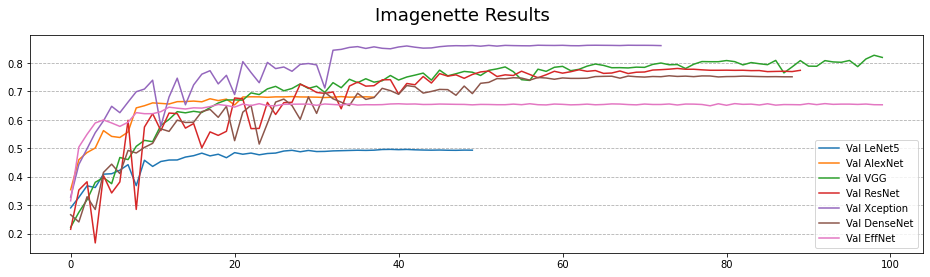

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(16, 4))
fig.suptitle('Imagenette Results', fontsize=18)

#histories = [lenet5_history, alexnet_history, vgg_history, resnet_history, xception_history, densenet_history]
    
ax.plot(lenet5_history.history['val_accuracy'], label='Val LeNet5')
ax.plot(alexnet_history.history['val_accuracy'], label='Val AlexNet')
ax.plot(vgg_history.history['val_accuracy'], label='Val VGG')
ax.plot(resnet_history.history['val_accuracy'], label='Val ResNet')
ax.plot(xception_history.history['val_accuracy'], label='Val Xception')
ax.plot(densenet_history.history['val_accuracy'], label='Val DenseNet')
ax.plot(effnet_history.history['val_accuracy'], label='Val EffNet')

ax.grid(axis='y', linestyle='--')

ax.legend()
plt.show()

In [75]:
models = {
    lenet5: 'LeNet5',
    alexnet: 'AlexNet',
    vgg16: 'VGGNet',
    resnet: 'ResNet50',
    xception: 'Xception',
    densenet: 'DenseNet',
    effnet: 'EffNet'
}

sizes = []

for model in models:
    sizes.append(model.count_params())
    
plt.scatter(sizes, )

TypeError: scatter() missing 1 required positional argument: 'y'